# **Bone marrow transplant**

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Dataset Description**
It covers medical information for children who have been diagnosed with a
variety of hematologic diseases and who underwent unmodified allogeneic unrelated donor HSCT. Hence, this dataset
comprises 187 occurrences and 37 attributes that contain information about individuals who have been diagnosed with a
range of hematologic malignant or benign diseases. Most of the properties contain categorical data, while others contain
Boolean and numerical values. Following data extraction, it was subjected to
exploratory data analysis using Jupyter Notebook and Python to find out the dataset's properties. The dataset has many
categorical attributes and missing values. The statistical data for the dataset's numerical variables are summarized in Table 1.

The motivation of the study was to identify the most important factors influencing the success or failure of the transplantation procedure. In particular, the aim was to verify the hypothesis that increased dosage of CD34+ cells / kg extends overall survival time without simultaneous occurrence of undesirable events affecting patients' quality of life.


##**Dataset attributes**
There are 10 numeric, 6 boolean, 21 categorical attributes.
###**Numeric attributes:**
1.  **donor_age**  - Age of the donor at the time of hematopoietic stem cells apheresis
2.  **recipient_age** - Age of the recipient of hematopoietic stem cells at the time of transplantation
3. **recipient_body_mass** - Body mass of the recipient of hematopoietic stem cells at the time of the transplantation
4. **CD34_x1e6_per_kg** - CD34kgx10d6 - CD34+ cell dose per kg of recipient body weight (10^6/kg)
5. **CD3_x1e8_per_kg** - CD3+ cell dose per kg of recipient body weight (10^8/kg)
6. **CD3_to_CD34_ratio** - CD3+ cell to CD34+ cell ratio
7. **ANC_recovery** - Time required for neutrophil recovery is defined as a neutrophil count
greater than 0.5 x 10^9/L
8. **PLT_recovery** - Platelet reproducing period is defined as count >50000/mm3
9. **time_to_acute_GvHD_III_IV** - Time required for the onset of stage III or IV acute graft against host
disease
10. **survival_time** -I n days, the time of observation or time to event

###**Boolean attributes:**
1. **donor_age_below_35** - Is the donor under the age of 35?
2. **recipient_age_below_10** - Is the recipient's age under ten?
3. **tx_post_relapse** - The second bone marrow transplant following recurrence
4. **acute_GvHD_II_III_IV** - Development of stage II, III, or IV acute graft versus host disease
5. **acute_GvHD_III_IV** - Stage III or IV growth of acute graft versus host disease
6. **relapse** - Disease relapse

###**Categorical attributes:**
1. **disease** - Disease classification
2. **disease_group** - Malignant or nonmalignant
3. **gender_match** - Gender compatibility between donor and recipient
4. **ABO_match** - HSC donor-recipient blood group compatibility
5. **CMV_status** - Serological compatibility of hematopoietic stem cell donors and recipients
based on CMV infection prior to transplantation
6. **HLA_match** - Antigen compatibility between the donor and receiver of hematopoietic
stem cells
7. **HLA_mismatch** - HLA mismatches or matches
8. **antigen** - How many antigens differ between the donor and receiver
9. **allel** - How many alleles differ between the donor and receiver
10. **HLA_group_1** - The donor-recipient difference
11.**risk_group** - Group at risk
12. **stem_cell_source** - Hematopoietic stem cell source
13.**extensive_chronic_GvHD** - Chronic graft versus host disease develops to a large extent
14. **survival_status** - Status of survival
15. **donor_ABO** - The hematopoietic stem cell donor's ABO blood group
16. **donor_CMV** - Cytomegalovirus infection prior to transplantation in the donor of hematopoietic stem cells
17. **recipient_age_int** - Distinct intervals of the recipient's age
18. **recipient_gender** - The recipient's gender
19. **recipient_ABO** - The recipient's ABO blood group
20. **recipient_rh** - The Rh factor is present on the recipient's red blood cells
21. **recipient_CMV** - Cytomegalovirus infection prior to transplantation in the donor of
hematopoietic stem cells





In [ ]:
# Let us load in the relevant Python modules
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import warnings
from collections import Counter
from sklearn.feature_selection import mutual_info_classif
warnings.filterwarnings('ignore')

import matplotlib.gridspec as gridspec # to do the grid of plots

In [ ]:
# reading data from csv file
#/content/drive/MyDrive/
df = pd.read_csv('bone-marrow.csv')

In [ ]:
# prinitng 1st 10 rows with headings  
data_top = df.head()
pd.set_option('display.max_columns', 500)

df.head(10)

,id,donor_age,donor_age_below_35,donor_ABO,donor_CMV,recipient_age,recipient_age_below_10,recipient_age_int,recipient_gender,recipient_body_mass,recipient_ABO,recipient_rh,recipient_CMV,disease,disease_group,gender_match,ABO_match,CMV_status,HLA_match_10,HLA_mismatch,antigen,allel,HLA_group_1,risk_group,stem_cell_source,tx_post_relapse,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,acute_GvHD_II_III_IV,acute_GvHD_III_IV,time_to_acute_GvHD_III_IV,extensive_chronic_GvHD,relapse,survival_time,survival_status
0,1,22.830137,yes,A,present,9.6,yes,5_10,male,35,A,plus,present,ALL,malignant,other,matched,3,10,matched,0,0,matched,high,peripheral_blood,no,7.20,5.38,1.33876,19,51,yes,yes,32,no,no,999,0
1,2,23.342466,yes,B,absent,4.0,yes,0_5,male,20.6,B,plus,absent,ALL,malignant,other,matched,0,10,matched,0,0,matched,low,bone_marrow,no,4.50,0.41,11.078295,16,37,yes,no,1000000,no,yes,163,1
2,3,26.394521,yes,B,absent,6.6,yes,5_10,male,23.4,B,plus,present,ALL,malignant,other,matched,2,10,matched,0,0,matched,low,bone_marrow,no,7.94,0.42,19.01323,23,20,yes,no,1000000,no,yes,435,1
3,4,39.684932,no,A,present,18.1,no,10_20,female,50,AB,plus,absent,AML,malignant,other,mismatched,1,10,matched,0,0,matched,low,bone_marrow,no,4.25,0.14,29.481647,23,29,yes,yes,19,?,no,53,1
4,5,33.358904,yes,A,absent,1.3,yes,0_5,female,9,AB,minus,present,chronic,malignant,other,mismatched,0,9,matched,2,1,one_antigen,high,peripheral_blood,no,51.85,13.05,3.972255,14,14,no,no,1000000,no,no,2043,0
5,6,27.391781,yes,AB,?,8.9,yes,5_10,male,40,0,plus,present,chronic,malignant,other,mismatched,?,10,matched,0,0,matched,high,bone_marrow,yes,3.27,0.39,8.412758,16,70,no,no,1000000,no,no,2800,0
6,7,34.520548,yes,0,absent,14.4,no,10_20,female,51,A,minus,?,AML,malignant,other,mismatched,?,10,matched,0,0,matched,low,peripheral_blood,no,17.78,7.39,2.406248,17,29,yes,yes,18,?,no,41,1
7,8,21.435616,yes,0,present,18.2,no,10_20,male,56,A,plus,absent,nonmalignant,nonmalignant,other,mismatched,1,7,mismatched,2,3,mismatched,low,bone_marrow,no,6.41,?,?,22,58,yes,yes,22,?,no,45,1
8,9,32.641096,yes,AB,absent,7.9,yes,5_10,male,20.5,0,plus,present,nonmalignant,nonmalignant,other,mismatched,2,10,matched,0,0,matched,low,peripheral_blood,no,23.54,6.24,3.772555,15,14,no,no,1000000,no,no,671,0
9,10,28.783562,yes,A,absent,4.7,yes,0_5,male,16.5,0,plus,present,nonmalignant,nonmalignant,female_to_male,mismatched,2,9,matched,1,2,DRB1_cell,low,peripheral_blood,no,7.69,7.43,1.035244,16,17,yes,no,1000000,no,no,676,0


In [ ]:
# Taking a look at how many rows and columns this dataset contains
rows = df.shape[0]
columns = df.shape[1]
print("This dataset contains {0} rows and {1} columns".format(rows, columns))

This dataset contains 187 rows and 38 columns


In [ ]:
df.isnull().any().any()

False

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 38 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         187 non-null    int64  
 1   donor_age                  187 non-null    float64
 2   donor_age_below_35         187 non-null    object 
 3   donor_ABO                  187 non-null    object 
 4   donor_CMV                  187 non-null    object 
 5   recipient_age              187 non-null    float64
 6   recipient_age_below_10     187 non-null    object 
 7   recipient_age_int          187 non-null    object 
 8   recipient_gender           187 non-null    object 
 9   recipient_body_mass        187 non-null    object 
 10  recipient_ABO              187 non-null    object 
 11  recipient_rh               187 non-null    object 
 12  recipient_CMV              187 non-null    object 
 13  disease                    187 non-null    object 

In [ ]:
df = df
df = df.replace('?', np.NaN)

In [ ]:
df.isnull().any().any()

True

In [ ]:
missing = df.isnull().sum().sum()
print("This dataset has {} missing values".format(missing))

This dataset has 81 missing values


In [ ]:
pd.set_option('display.max_rows', 500)
df.isnull().sum()

id                            0
donor_age                     0
donor_age_below_35            0
donor_ABO                     0
donor_CMV                     2
recipient_age                 0
recipient_age_below_10        0
recipient_age_int             0
recipient_gender              0
recipient_body_mass           2
recipient_ABO                 1
recipient_rh                  2
recipient_CMV                14
disease                       0
disease_group                 0
gender_match                  0
ABO_match                     1
CMV_status                   16
HLA_match_10                  0
HLA_mismatch                  0
antigen                       1
allel                         1
HLA_group_1                   0
risk_group                    0
stem_cell_source              0
tx_post_relapse               0
CD34_x1e6_per_kg              0
CD3_x1e8_per_kg               5
CD3_to_CD34_ratio             5
ANC_recovery                  0
PLT_recovery                  0
acute_Gv

In [ ]:
##column 'id' is of no use, so we are dropping it
df = df.drop(["id"],axis=1)

In [ ]:
df.recipient_body_mass = pd.to_numeric(df.recipient_body_mass, errors = 'coerce')
#converting object dtype columns to numeric


In [ ]:
df.CD3_x1e8_per_kg = pd.to_numeric(df.CD3_x1e8_per_kg, errors = 'coerce')

In [ ]:
df.CD3_to_CD34_ratio = pd.to_numeric(df.CD3_to_CD34_ratio, errors = 'coerce')

In [ ]:
df.columns

Index(['donor_age', 'donor_age_below_35', 'donor_ABO', 'donor_CMV',
       'recipient_age', 'recipient_age_below_10', 'recipient_age_int',
       'recipient_gender', 'recipient_body_mass', 'recipient_ABO',
       'recipient_rh', 'recipient_CMV', 'disease', 'disease_group',
       'gender_match', 'ABO_match', 'CMV_status', 'HLA_match_10',
       'HLA_mismatch', 'antigen', 'allel', 'HLA_group_1', 'risk_group',
       'stem_cell_source', 'tx_post_relapse', 'CD34_x1e6_per_kg',
       'CD3_x1e8_per_kg', 'CD3_to_CD34_ratio', 'ANC_recovery', 'PLT_recovery',
       'acute_GvHD_II_III_IV', 'acute_GvHD_III_IV',
       'time_to_acute_GvHD_III_IV', 'extensive_chronic_GvHD', 'relapse',
       'survival_time', 'survival_status'],
      dtype='object')

In [ ]:
#converting int dtype columns to string
df['HLA_match_10'] = df['HLA_match_10'].astype(str)
df['survival_status'] = df['survival_status'].astype(str) 


In [ ]:
df.dtypes

donor_age                    float64
donor_age_below_35            object
donor_ABO                     object
donor_CMV                     object
recipient_age                float64
recipient_age_below_10        object
recipient_age_int             object
recipient_gender              object
recipient_body_mass          float64
recipient_ABO                 object
recipient_rh                  object
recipient_CMV                 object
disease                       object
disease_group                 object
gender_match                  object
ABO_match                     object
CMV_status                    object
HLA_match_10                  object
HLA_mismatch                  object
antigen                       object
allel                         object
HLA_group_1                   object
risk_group                    object
stem_cell_source              object
tx_post_relapse               object
CD34_x1e6_per_kg             float64
CD3_x1e8_per_kg              float64
C

## Table 1

In [ ]:
# prinitng basic info about the data
data_summary = df.describe()
df.describe()

,donor_age,recipient_age,recipient_body_mass,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,time_to_acute_GvHD_III_IV,survival_time
count,187.000000,187.000000,185.000000,187.000000,182.000000,182.000000,187.000000,187.000000,187.000000,187.000000
mean,33.472068,9.931551,35.801081,11.891781,4.745714,5.385096,26752.866310,90937.919786,775408.042781,938.743316
std,8.271826,5.305639,19.650922,9.914386,3.859128,9.598716,161747.200525,288242.407688,418425.252689,849.589495
min,18.646575,0.600000,6.000000,0.790000,0.040000,0.204132,9.000000,9.000000,10.000000,6.000000
25%,27.039726,5.050000,19.000000,5.350000,1.687500,1.786683,13.000000,16.000000,1000000.000000,168.500000
50%,33.550685,9.600000,33.000000,9.720000,4.325000,2.734462,15.000000,21.000000,1000000.000000,676.000000
75%,40.117809,14.050000,50.600000,15.415000,6.785000,5.823565,17.000000,37.000000,1000000.000000,1604.000000
max,55.553425,20.200000,103.400000,57.780000,20.020000,99.560970,1000000.000000,1000000.000000,1000000.000000,3364.000000


In [ ]:
df.isnull().sum()

donor_age                     0
donor_age_below_35            0
donor_ABO                     0
donor_CMV                     2
recipient_age                 0
recipient_age_below_10        0
recipient_age_int             0
recipient_gender              0
recipient_body_mass           2
recipient_ABO                 1
recipient_rh                  2
recipient_CMV                14
disease                       0
disease_group                 0
gender_match                  0
ABO_match                     1
CMV_status                   16
HLA_match_10                  0
HLA_mismatch                  0
antigen                       1
allel                         1
HLA_group_1                   0
risk_group                    0
stem_cell_source              0
tx_post_relapse               0
CD34_x1e6_per_kg              0
CD3_x1e8_per_kg               5
CD3_to_CD34_ratio             5
ANC_recovery                  0
PLT_recovery                  0
acute_GvHD_II_III_IV          0
acute_Gv

In [ ]:
cols1 = ["recipient_body_mass", "CD3_x1e8_per_kg", "CD3_to_CD34_ratio"] #replacing the missing numeric values with median of that column
df[cols1]=df[cols1].fillna(df.median().iloc[0])

In [ ]:
df.head(10)

,donor_age,donor_age_below_35,donor_ABO,donor_CMV,recipient_age,recipient_age_below_10,recipient_age_int,recipient_gender,recipient_body_mass,recipient_ABO,recipient_rh,recipient_CMV,disease,disease_group,gender_match,ABO_match,CMV_status,HLA_match_10,HLA_mismatch,antigen,allel,HLA_group_1,risk_group,stem_cell_source,tx_post_relapse,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,acute_GvHD_II_III_IV,acute_GvHD_III_IV,time_to_acute_GvHD_III_IV,extensive_chronic_GvHD,relapse,survival_time,survival_status
0,22.830137,yes,A,present,9.6,yes,5_10,male,35.0,A,plus,present,ALL,malignant,other,matched,3,10,matched,0,0,matched,high,peripheral_blood,no,7.20,5.380000,1.338760,19,51,yes,yes,32,no,no,999,0
1,23.342466,yes,B,absent,4.0,yes,0_5,male,20.6,B,plus,absent,ALL,malignant,other,matched,0,10,matched,0,0,matched,low,bone_marrow,no,4.50,0.410000,11.078295,16,37,yes,no,1000000,no,yes,163,1
2,26.394521,yes,B,absent,6.6,yes,5_10,male,23.4,B,plus,present,ALL,malignant,other,matched,2,10,matched,0,0,matched,low,bone_marrow,no,7.94,0.420000,19.013230,23,20,yes,no,1000000,no,yes,435,1
3,39.684932,no,A,present,18.1,no,10_20,female,50.0,AB,plus,absent,AML,malignant,other,mismatched,1,10,matched,0,0,matched,low,bone_marrow,no,4.25,0.140000,29.481647,23,29,yes,yes,19,NaN,no,53,1
4,33.358904,yes,A,absent,1.3,yes,0_5,female,9.0,AB,minus,present,chronic,malignant,other,mismatched,0,9,matched,2,1,one_antigen,high,peripheral_blood,no,51.85,13.050000,3.972255,14,14,no,no,1000000,no,no,2043,0
5,27.391781,yes,AB,NaN,8.9,yes,5_10,male,40.0,0,plus,present,chronic,malignant,other,mismatched,NaN,10,matched,0,0,matched,high,bone_marrow,yes,3.27,0.390000,8.412758,16,70,no,no,1000000,no,no,2800,0
6,34.520548,yes,0,absent,14.4,no,10_20,female,51.0,A,minus,NaN,AML,malignant,other,mismatched,NaN,10,matched,0,0,matched,low,peripheral_blood,no,17.78,7.390000,2.406248,17,29,yes,yes,18,NaN,no,41,1
7,21.435616,yes,0,present,18.2,no,10_20,male,56.0,A,plus,absent,nonmalignant,nonmalignant,other,mismatched,1,7,mismatched,2,3,mismatched,low,bone_marrow,no,6.41,33.550685,33.550685,22,58,yes,yes,22,NaN,no,45,1
8,32.641096,yes,AB,absent,7.9,yes,5_10,male,20.5,0,plus,present,nonmalignant,nonmalignant,other,mismatched,2,10,matched,0,0,matched,low,peripheral_blood,no,23.54,6.240000,3.772555,15,14,no,no,1000000,no,no,671,0
9,28.783562,yes,A,absent,4.7,yes,0_5,male,16.5,0,plus,present,nonmalignant,nonmalignant,female_to_male,mismatched,2,9,matched,1,2,DRB1_cell,low,peripheral_blood,no,7.69,7.430000,1.035244,16,17,yes,no,1000000,no,no,676,0


In [ ]:
df.isnull().sum()

donor_age                     0
donor_age_below_35            0
donor_ABO                     0
donor_CMV                     2
recipient_age                 0
recipient_age_below_10        0
recipient_age_int             0
recipient_gender              0
recipient_body_mass           0
recipient_ABO                 1
recipient_rh                  2
recipient_CMV                14
disease                       0
disease_group                 0
gender_match                  0
ABO_match                     1
CMV_status                   16
HLA_match_10                  0
HLA_mismatch                  0
antigen                       1
allel                         1
HLA_group_1                   0
risk_group                    0
stem_cell_source              0
tx_post_relapse               0
CD34_x1e6_per_kg              0
CD3_x1e8_per_kg               0
CD3_to_CD34_ratio             0
ANC_recovery                  0
PLT_recovery                  0
acute_GvHD_II_III_IV          0
acute_Gv

In [ ]:
#cols2 = ["recipient_CMV", "extensive_chronic_GvHD","donor_CMV","recipient_ABO","recipient_rh","ABO_match","extensive_chronic_GvHD"]
cols2 = ["recipient_CMV", "extensive_chronic_GvHD"] #replacing the missing values of these two columns with mode of the respective columns
df[cols2]=df[cols2].fillna(df.mode().iloc[0])

In [ ]:
df = df.dropna() #dropping the rows which has atleast one null value

In [ ]:
df.isnull().sum()

donor_age                    0
donor_age_below_35           0
donor_ABO                    0
donor_CMV                    0
recipient_age                0
recipient_age_below_10       0
recipient_age_int            0
recipient_gender             0
recipient_body_mass          0
recipient_ABO                0
recipient_rh                 0
recipient_CMV                0
disease                      0
disease_group                0
gender_match                 0
ABO_match                    0
CMV_status                   0
HLA_match_10                 0
HLA_mismatch                 0
antigen                      0
allel                        0
HLA_group_1                  0
risk_group                   0
stem_cell_source             0
tx_post_relapse              0
CD34_x1e6_per_kg             0
CD3_x1e8_per_kg              0
CD3_to_CD34_ratio            0
ANC_recovery                 0
PLT_recovery                 0
acute_GvHD_II_III_IV         0
acute_GvHD_III_IV            0
time_to_

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 169 entries, 0 to 185
Data columns (total 37 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   donor_age                  169 non-null    float64
 1   donor_age_below_35         169 non-null    object 
 2   donor_ABO                  169 non-null    object 
 3   donor_CMV                  169 non-null    object 
 4   recipient_age              169 non-null    float64
 5   recipient_age_below_10     169 non-null    object 
 6   recipient_age_int          169 non-null    object 
 7   recipient_gender           169 non-null    object 
 8   recipient_body_mass        169 non-null    float64
 9   recipient_ABO              169 non-null    object 
 10  recipient_rh               169 non-null    object 
 11  recipient_CMV              169 non-null    object 
 12  disease                    169 non-null    object 
 13  disease_group              169 non-null    object 

## **Scatter plots**

In [ ]:
# Scatter and density plots for numeric attributes
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    
    
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.6, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

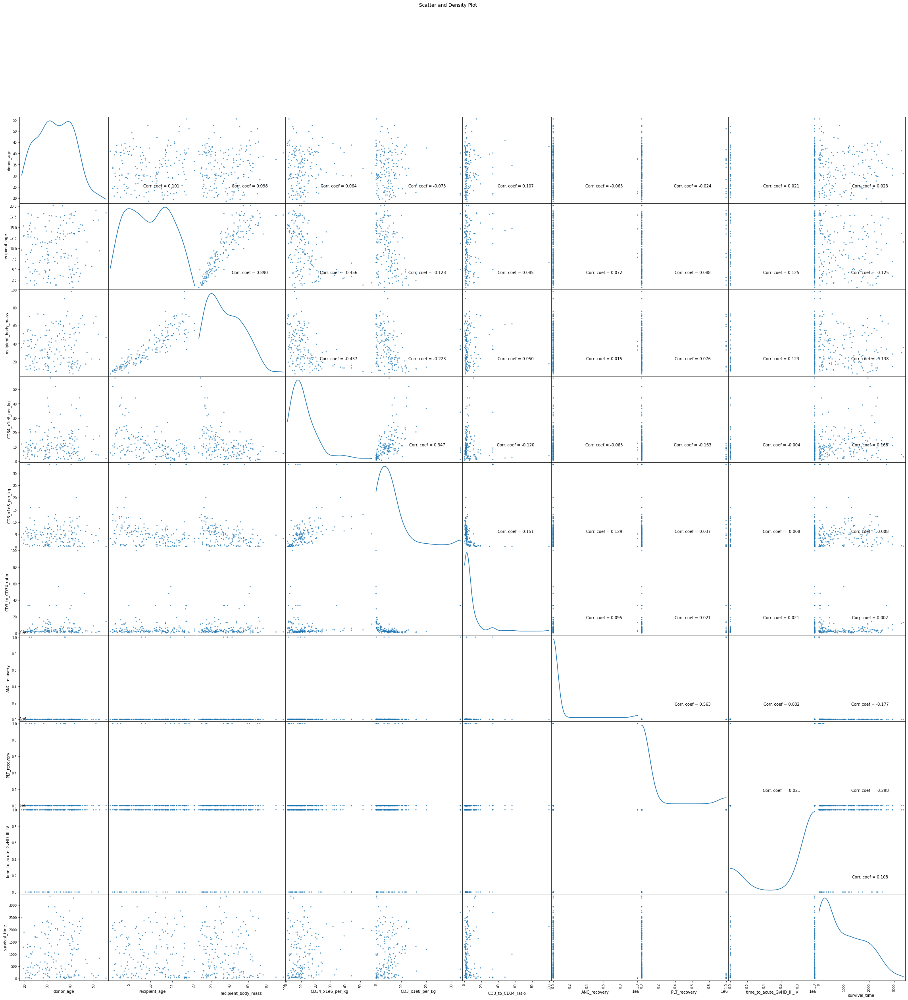

In [ ]:
plotScatterMatrix(df, 40, 10)

## **Heat map**

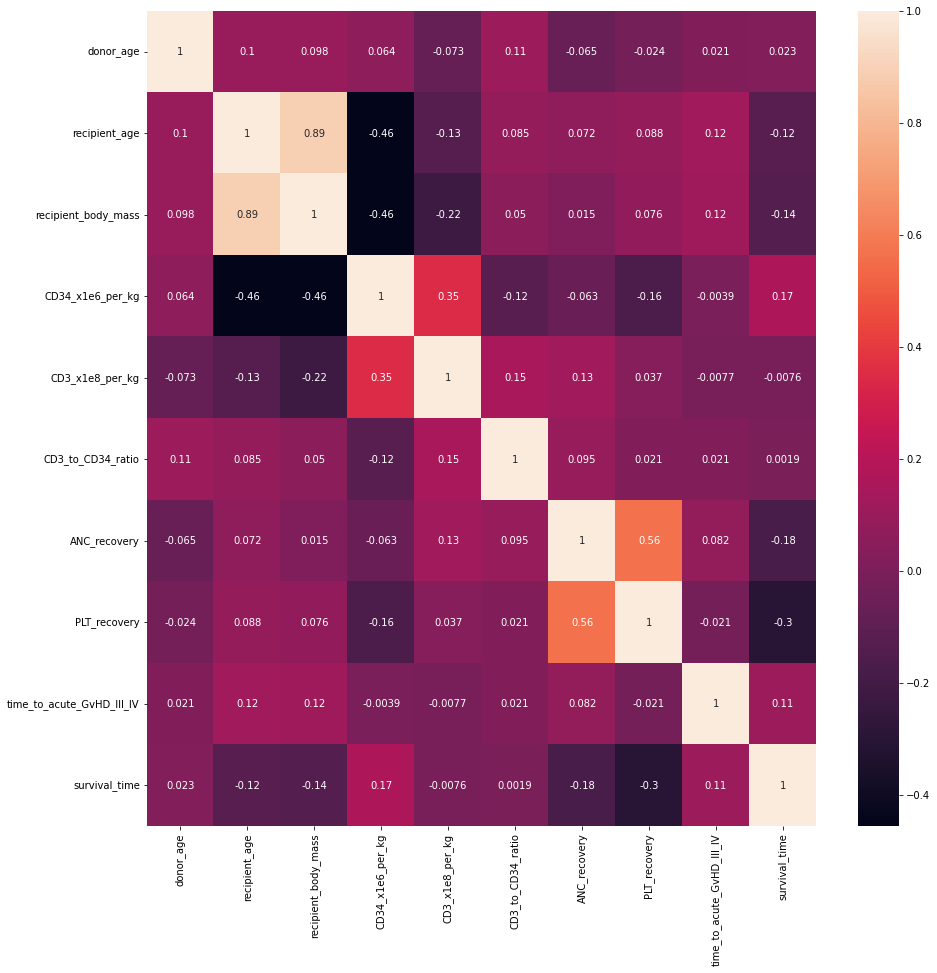

In [ ]:
#for correlation 
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True)

## **Pandas profiling report**

In [ ]:
# for pandas profiling report
!pip install https://github.com/ydataai/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/ydataai/pandas-profiling/archive/master.zip (21.9 MB)


In [ ]:
import pandas_profiling 
from pandas_profiling import ProfileReport 

In [ ]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#analysing evey attribute wrt to  Survival Status

df.head()

,donor_age,donor_age_below_35,donor_ABO,donor_CMV,recipient_age,recipient_age_below_10,recipient_age_int,recipient_gender,recipient_body_mass,recipient_ABO,recipient_rh,recipient_CMV,disease,disease_group,gender_match,ABO_match,CMV_status,HLA_match_10,HLA_mismatch,antigen,allel,HLA_group_1,risk_group,stem_cell_source,tx_post_relapse,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,acute_GvHD_II_III_IV,acute_GvHD_III_IV,time_to_acute_GvHD_III_IV,extensive_chronic_GvHD,relapse,survival_time,survival_status
0,22.830137,yes,A,present,9.6,yes,5_10,male,35.0,A,plus,present,ALL,malignant,other,matched,3,10,matched,0,0,matched,high,peripheral_blood,no,7.20,5.38,1.338760,19,51,yes,yes,32,no,no,999,0
1,23.342466,yes,B,absent,4.0,yes,0_5,male,20.6,B,plus,absent,ALL,malignant,other,matched,0,10,matched,0,0,matched,low,bone_marrow,no,4.50,0.41,11.078295,16,37,yes,no,1000000,no,yes,163,1
2,26.394521,yes,B,absent,6.6,yes,5_10,male,23.4,B,plus,present,ALL,malignant,other,matched,2,10,matched,0,0,matched,low,bone_marrow,no,7.94,0.42,19.013230,23,20,yes,no,1000000,no,yes,435,1
3,39.684932,no,A,present,18.1,no,10_20,female,50.0,AB,plus,absent,AML,malignant,other,mismatched,1,10,matched,0,0,matched,low,bone_marrow,no,4.25,0.14,29.481647,23,29,yes,yes,19,no,no,53,1
4,33.358904,yes,A,absent,1.3,yes,0_5,female,9.0,AB,minus,present,chronic,malignant,other,mismatched,0,9,matched,2,1,one_antigen,high,peripheral_blood,no,51.85,13.05,3.972255,14,14,no,no,1000000,no,no,2043,0


# **Box Plots and Bar Plots**

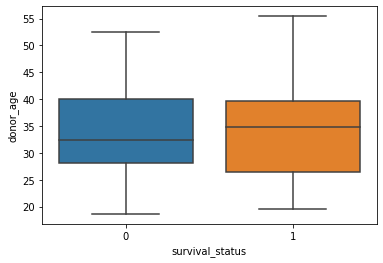

In [ ]:
sns.boxplot(x=df.survival_status,y=df["donor_age"])
## 1 means not survived, 0 means survived
#if donor age is less than 20 than recpient has survived

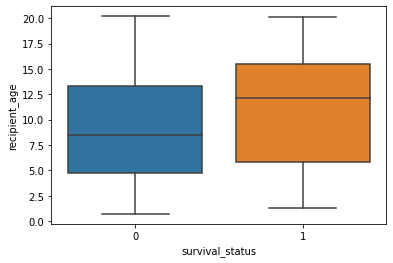

In [ ]:
sns.boxplot(x=df.survival_status,y=df["recipient_age"])
#Lower age recipents has more chances for survival.Especially which are below 10, and if age is below 2 of recipent then he has high percentage of Survival.


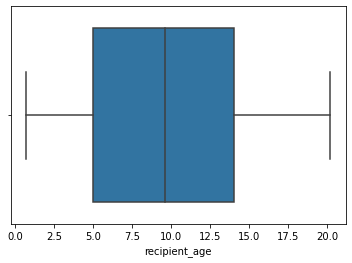

In [ ]:
sns.boxplot(df["recipient_age"])
#No outlier in recipent age all values lies between 0 to 20.

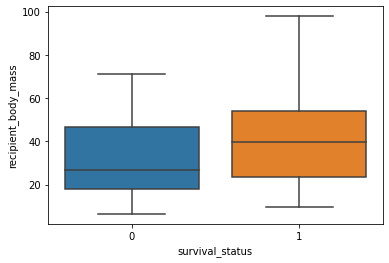

In [ ]:
sns.boxplot(x=df.survival_status,y=df["recipient_body_mass"])
## 1 means not survived, 0 means survived
#the one with body mass more than 75 has not survived.

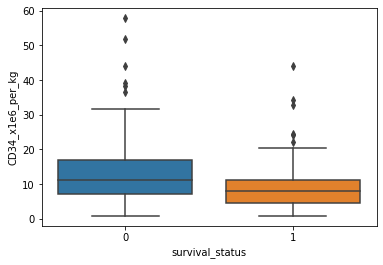

In [ ]:
sns.boxplot(x=df.survival_status,y=df["CD34_x1e6_per_kg"])

In [ ]:
# remove rows by filtering
df_CD34_x1e6_per_kg = df[df['CD34_x1e6_per_kg'] < 30]
df_CD34_x1e6_per_kg.shape

(159, 37)

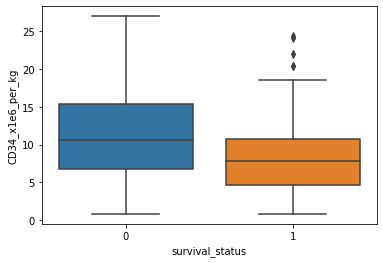

In [ ]:
sns.boxplot(x=df_CD34_x1e6_per_kg.survival_status,y=df_CD34_x1e6_per_kg["CD34_x1e6_per_kg"])
# 1 means not survived, 0 means survived
# when CD34_x1e6_per_kg is above 10, the survaival chance is high

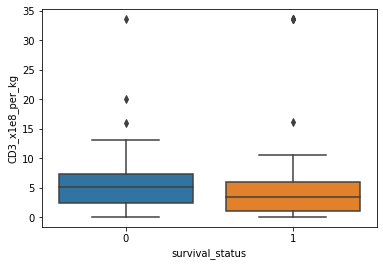

In [ ]:
sns.boxplot(x=df.survival_status,y=df["CD3_x1e8_per_kg"])
#Survival rate for the recipients is high with CD3 cell dose per kg above 7 and low if it is below 2

In [ ]:
# remove rows by filtering
df_CD3_to_CD34_ratio = df[df['CD3_to_CD34_ratio'] < 60]
df_CD3_to_CD34_ratio.shape

(168, 37)

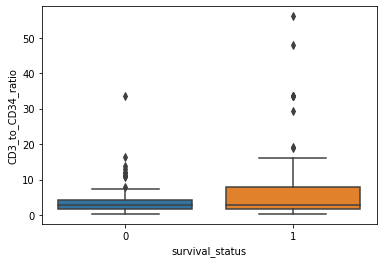

In [ ]:
sns.boxplot(x=df_CD3_to_CD34_ratio.survival_status,y=df_CD3_to_CD34_ratio["CD3_to_CD34_ratio"])

In [ ]:
# remove rows by filtering
df_ANC_recovery = df[df['ANC_recovery'] != 1000000]
# display the last 10 rows of modified dataframe where rows in which attribute ANC_recovery has a value of 1000000 are removed. 4 rows are removed.
df_ANC_recovery.shape

(165, 37)

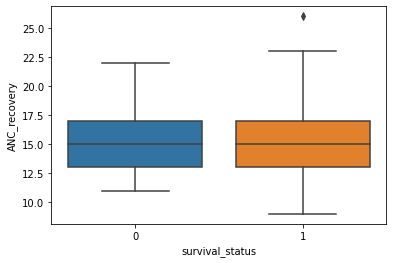

In [ ]:
sns.boxplot(x=df_ANC_recovery.survival_status,y=df_ANC_recovery["ANC_recovery"])

In [ ]:
# remove rows by filtering
df_PLT_recovery = df[df['PLT_recovery'] != 1000000]

df_PLT_recovery.shape

(157, 37)

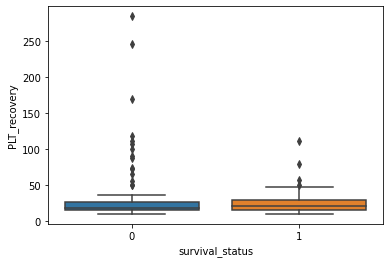

In [ ]:
sns.boxplot(x=df_PLT_recovery.survival_status,y=df_PLT_recovery["PLT_recovery"])

In [ ]:
# remove rows by filtering
df_PLT_recovery = df[df['PLT_recovery'] < 60]

df_PLT_recovery.shape

(143, 37)

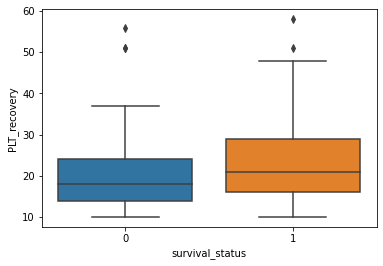

In [ ]:
sns.boxplot(x=df_PLT_recovery.survival_status,y=df_PLT_recovery["PLT_recovery"])

In [ ]:
# Getting the list of all columns
columns_hist = list(df.columns)

columns_hist.remove('donor_age')
columns_hist.remove('recipient_age')
columns_hist.remove('recipient_body_mass')
columns_hist.remove('CD34_x1e6_per_kg')
columns_hist.remove('CD3_x1e8_per_kg')
columns_hist.remove('CD3_to_CD34_ratio')
columns_hist.remove('ANC_recovery')
columns_hist.remove('PLT_recovery')
columns_hist.remove('time_to_acute_GvHD_III_IV')
columns_hist.remove('survival_time')



columns_hist_nparray = np.array(columns_hist)


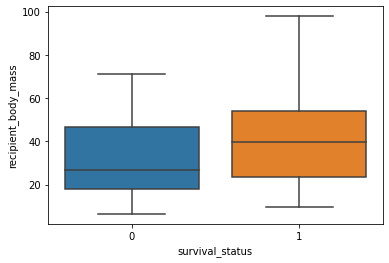

In [ ]:
sns.boxplot(x=df.survival_status,y=df["recipient_body_mass"])
## 1 means not survived, 0 means survived
#the one with body mass more than 75 has not survived.

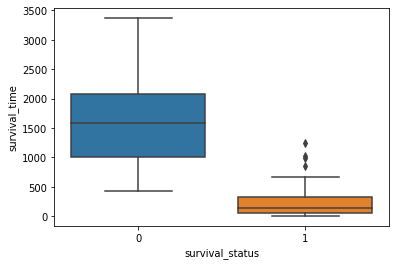

In [ ]:
sns.boxplot(x=df.survival_status,y=df["survival_time"])
# WHEN THE SURVAIVAL_TIME IS BETWEEN 1000 TO 2000, THERE ARE MORE CHANCES TO SURVIVE AND 
# IF THE TIME IS BELOW 500 , ITS MORE PROBABLE THAT THE PERSON DONT SURVIVE 

## **Bar plots for categorical variables**

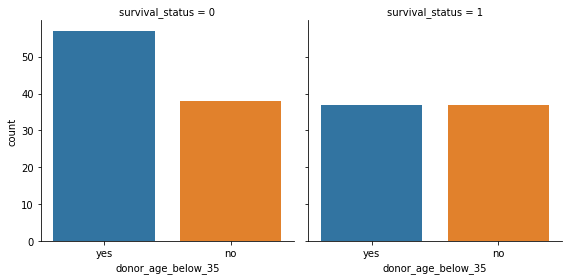

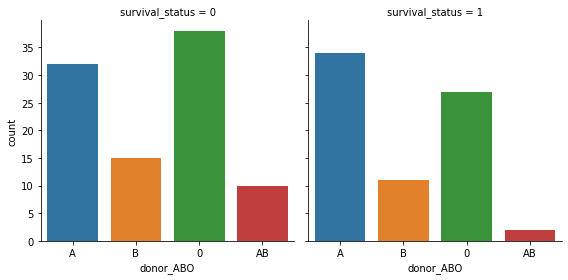

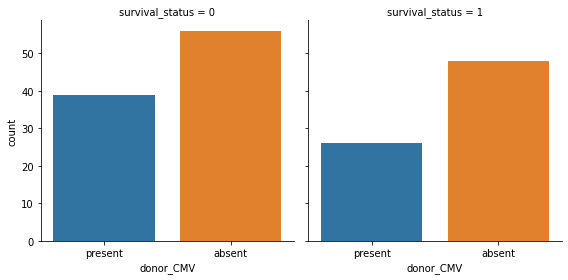

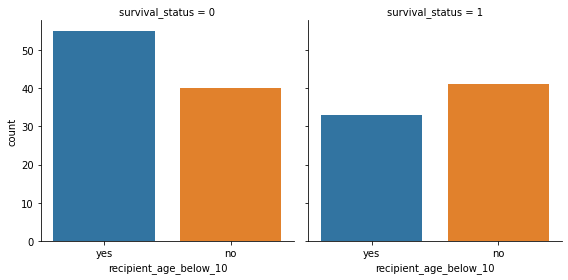

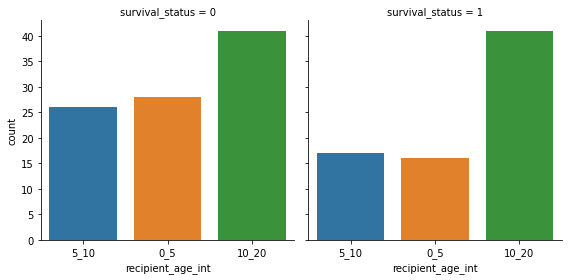

...

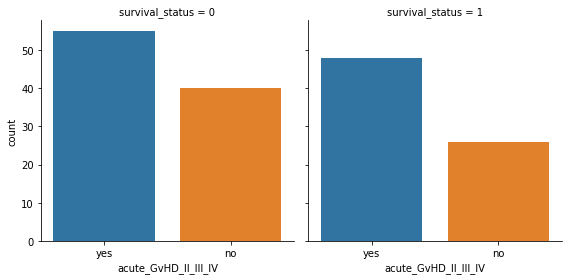

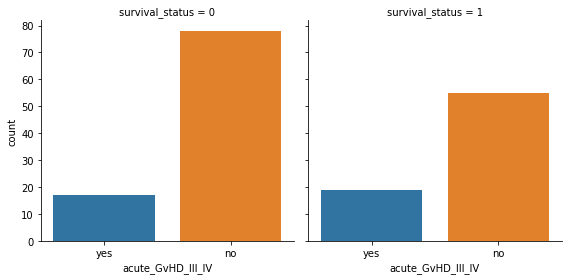

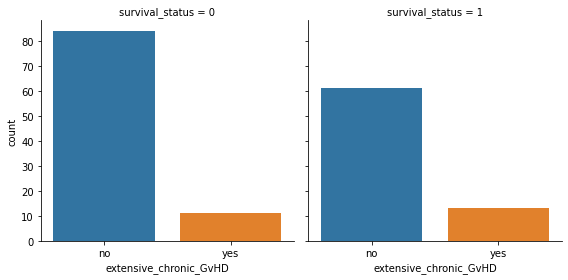

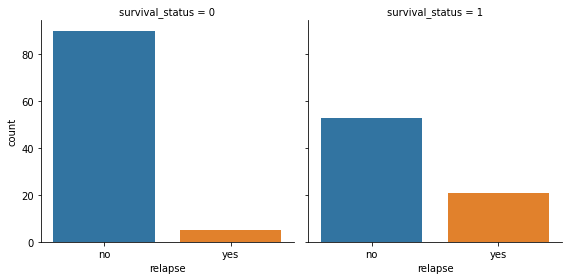

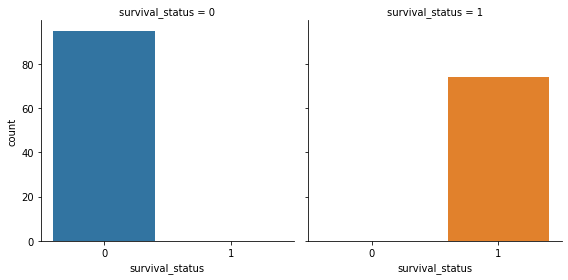

In [ ]:
 col_list = columns_hist

 for col in col_list:
     if col == 'HLA_group_1':
         aspect_ratio = 2.0
     elif col == 'disease':
         aspect_ratio = 2.0
     else:
       aspect_ratio = 1.0
        
     plot_cat_data = sns.catplot(x=col, col='survival_status', data = df, kind='count', height=4, aspect=aspect_ratio)

In [ ]:
df.shape

(169, 37)

# **Encoding**

In [ ]:
##encoding 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 169 entries, 0 to 185
Data columns (total 37 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   donor_age                  169 non-null    float64
 1   donor_age_below_35         169 non-null    object 
 2   donor_ABO                  169 non-null    object 
 3   donor_CMV                  169 non-null    object 
 4   recipient_age              169 non-null    float64
 5   recipient_age_below_10     169 non-null    object 
 6   recipient_age_int          169 non-null    object 
 7   recipient_gender           169 non-null    object 
 8   recipient_body_mass        169 non-null    float64
 9   recipient_ABO              169 non-null    object 
 10  recipient_rh               169 non-null    object 
 11  recipient_CMV              169 non-null    object 
 12  disease                    169 non-null    object 
 13  disease_group              169 non-null    object 

In [ ]:
g = df.columns.to_series().groupby(df.dtypes).groups

In [ ]:
g

{int64: ['ANC_recovery', 'PLT_recovery', 'time_to_acute_GvHD_III_IV', 'survival_time'], float64: ['donor_age', 'recipient_age', 'recipient_body_mass', 'CD34_x1e6_per_kg', 'CD3_x1e8_per_kg', 'CD3_to_CD34_ratio'], object: ['donor_age_below_35', 'donor_ABO', 'donor_CMV', 'recipient_age_below_10', 'recipient_age_int', 'recipient_gender', 'recipient_ABO', 'recipient_rh', 'recipient_CMV', 'disease', 'disease_group', 'gender_match', 'ABO_match', 'CMV_status', 'HLA_match_10', 'HLA_mismatch', 'antigen', 'allel', 'HLA_group_1', 'risk_group', 'stem_cell_source', 'tx_post_relapse', 'acute_GvHD_II_III_IV', 'acute_GvHD_III_IV', 'extensive_chronic_GvHD', 'relapse', 'survival_status']}

In [ ]:
##one hot encoding  for coversrion of variables......
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [ ]:
dfle = df
dfle.head()


,donor_age,donor_age_below_35,donor_ABO,donor_CMV,recipient_age,recipient_age_below_10,recipient_age_int,recipient_gender,recipient_body_mass,recipient_ABO,recipient_rh,recipient_CMV,disease,disease_group,gender_match,ABO_match,CMV_status,HLA_match_10,HLA_mismatch,antigen,allel,HLA_group_1,risk_group,stem_cell_source,tx_post_relapse,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,acute_GvHD_II_III_IV,acute_GvHD_III_IV,time_to_acute_GvHD_III_IV,extensive_chronic_GvHD,relapse,survival_time,survival_status
0,22.830137,yes,A,present,9.6,yes,5_10,male,35.0,A,plus,present,ALL,malignant,other,matched,3,10,matched,0,0,matched,high,peripheral_blood,no,7.20,5.38,1.338760,19,51,yes,yes,32,no,no,999,0
1,23.342466,yes,B,absent,4.0,yes,0_5,male,20.6,B,plus,absent,ALL,malignant,other,matched,0,10,matched,0,0,matched,low,bone_marrow,no,4.50,0.41,11.078295,16,37,yes,no,1000000,no,yes,163,1
2,26.394521,yes,B,absent,6.6,yes,5_10,male,23.4,B,plus,present,ALL,malignant,other,matched,2,10,matched,0,0,matched,low,bone_marrow,no,7.94,0.42,19.013230,23,20,yes,no,1000000,no,yes,435,1
3,39.684932,no,A,present,18.1,no,10_20,female,50.0,AB,plus,absent,AML,malignant,other,mismatched,1,10,matched,0,0,matched,low,bone_marrow,no,4.25,0.14,29.481647,23,29,yes,yes,19,no,no,53,1
4,33.358904,yes,A,absent,1.3,yes,0_5,female,9.0,AB,minus,present,chronic,malignant,other,mismatched,0,9,matched,2,1,one_antigen,high,peripheral_blood,no,51.85,13.05,3.972255,14,14,no,no,1000000,no,no,2043,0


In [ ]:
objectd=['donor_age_below_35', 'donor_ABO', 'donor_CMV', 'recipient_age_below_10', 'recipient_age_int', 'recipient_gender', 'recipient_ABO', 'recipient_rh', 'recipient_CMV', 'disease', 'disease_group', 'gender_match', 'ABO_match', 'CMV_status', 'HLA_match_10', 'HLA_mismatch', 'antigen', 'allel', 'HLA_group_1', 'risk_group', 'stem_cell_source', 'tx_post_relapse', 'acute_GvHD_II_III_IV', 'acute_GvHD_III_IV', 'extensive_chronic_GvHD', 'relapse', 'survival_status']
for x in objectd:
  dfle[x] = le.fit_transform(dfle[x])

In [ ]:
dfle.head()

,donor_age,donor_age_below_35,donor_ABO,donor_CMV,recipient_age,recipient_age_below_10,recipient_age_int,recipient_gender,recipient_body_mass,recipient_ABO,recipient_rh,recipient_CMV,disease,disease_group,gender_match,ABO_match,CMV_status,HLA_match_10,HLA_mismatch,antigen,allel,HLA_group_1,risk_group,stem_cell_source,tx_post_relapse,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,acute_GvHD_II_III_IV,acute_GvHD_III_IV,time_to_acute_GvHD_III_IV,extensive_chronic_GvHD,relapse,survival_time,survival_status
0,22.830137,1,1,1,9.6,1,2,1,35.0,1,1,1,0,0,1,0,3,0,0,0,0,1,0,1,0,7.20,5.38,1.338760,19,51,1,1,32,0,0,999,0
1,23.342466,1,3,0,4.0,1,0,1,20.6,3,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,4.50,0.41,11.078295,16,37,1,0,1000000,0,1,163,1
2,26.394521,1,3,0,6.6,1,2,1,23.4,3,1,1,0,0,1,0,2,0,0,0,0,1,1,0,0,7.94,0.42,19.013230,23,20,1,0,1000000,0,1,435,1
3,39.684932,0,1,1,18.1,0,1,0,50.0,2,1,0,1,0,1,1,1,0,0,0,0,1,1,0,0,4.25,0.14,29.481647,23,29,1,1,19,0,0,53,1
4,33.358904,1,1,0,1.3,1,0,0,9.0,2,0,1,2,0,1,1,0,3,0,2,1,4,0,1,0,51.85,13.05,3.972255,14,14,0,0,1000000,0,0,2043,0


**CHI-SQUARE TEST**

In [ ]:
nominal_at=['disease','disease_group','gender_match','ABO_match','CMV_status','HLA_mismatch','antigen','allel','HLA_group_1','risk_group','stem_cell_source','extensive_chronic_GvHD','survival_status','donor_ABO','donor_CMV','recipient_age_int','recipient_gender','recipient_ABO','recipient_rh','recipient_CMV']
dfcs=dfle[nominal_at]
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(df[nominal_at],
                                              df['survival_status'],test_size=0.3,random_state=100)

In [ ]:
dfcs=df
dfle=df

In [ ]:
from sklearn.feature_selection import chi2
f_p_values=chi2(X_train,y_train)

In [ ]:
f_p_values


(array([4.33627132e-01, 8.36503756e-01, 5.26777875e-03, 4.05206427e-01,
        6.08999040e-02, 1.37612591e-01, 8.70149538e-02, 7.95256454e-01,
        7.68732403e-02, 1.85584505e+00, 4.26224493e-01, 3.37137840e-01,
        6.70000000e+01, 1.72291868e-01, 4.08533054e-02, 9.77151191e-02,
        6.60831051e-02, 1.95941517e-02, 8.96788566e-01, 1.09199394e-04]),
 array([5.10214516e-01, 3.60398617e-01, 9.42140768e-01, 5.24412616e-01,
        8.05079218e-01, 7.10666051e-01, 7.68006888e-01, 3.72515407e-01,
        7.81580288e-01, 1.73105108e-01, 5.13847371e-01, 5.61485992e-01,
        2.71507132e-16, 6.78082933e-01, 8.39821344e-01, 7.54589003e-01,
        7.97127558e-01, 8.88676494e-01, 3.43644277e-01, 9.91662377e-01]))

In [ ]:
import pandas as pd
p_values=pd.Series(f_p_values[1])
p_values.index=X_train.columns
p_values

disease                   5.102145e-01
disease_group             3.603986e-01
gender_match              9.421408e-01
ABO_match                 5.244126e-01
CMV_status                8.050792e-01
HLA_mismatch              7.106661e-01
antigen                   7.680069e-01
allel                     3.725154e-01
HLA_group_1               7.815803e-01
risk_group                1.731051e-01
stem_cell_source          5.138474e-01
extensive_chronic_GvHD    5.614860e-01
survival_status           2.715071e-16
donor_ABO                 6.780829e-01
donor_CMV                 8.398213e-01
recipient_age_int         7.545890e-01
recipient_gender          7.971276e-01
recipient_ABO             8.886765e-01
recipient_rh              3.436443e-01
recipient_CMV             9.916624e-01
dtype: float64

In [ ]:
p_values.sort_values(ascending=True)

survival_status           2.715071e-16
risk_group                1.731051e-01
recipient_rh              3.436443e-01
disease_group             3.603986e-01
allel                     3.725154e-01
disease                   5.102145e-01
stem_cell_source          5.138474e-01
ABO_match                 5.244126e-01
extensive_chronic_GvHD    5.614860e-01
donor_ABO                 6.780829e-01
HLA_mismatch              7.106661e-01
recipient_age_int         7.545890e-01
antigen                   7.680069e-01
HLA_group_1               7.815803e-01
recipient_gender          7.971276e-01
CMV_status                8.050792e-01
donor_CMV                 8.398213e-01
recipient_ABO             8.886765e-01
gender_match              9.421408e-01
recipient_CMV             9.916624e-01
dtype: float64

In [ ]:
#so from CHISquare test risk_group is most important column....

#**Normalization** 

In [ ]:
## using standard scaler for.......integer variables....to normalize them.....
from sklearn.preprocessing import MinMaxScaler
scaler = scaler = MinMaxScaler()


In [ ]:
dfle[['ANC_recovery', 'PLT_recovery', 'time_to_acute_GvHD_III_IV', 'survival_time','donor_age', 'recipient_age', 'recipient_body_mass', 'CD34_x1e6_per_kg', 'CD3_x1e8_per_kg', 'CD3_to_CD34_ratio']] = scaler.fit_transform(dfle[['ANC_recovery', 'PLT_recovery', 'time_to_acute_GvHD_III_IV', 'survival_time','donor_age', 'recipient_age', 'recipient_body_mass', 'CD34_x1e6_per_kg', 'CD3_x1e8_per_kg', 'CD3_to_CD34_ratio']])

In [ ]:
dfle.head()

,donor_age,donor_age_below_35,donor_ABO,donor_CMV,recipient_age,recipient_age_below_10,recipient_age_int,recipient_gender,recipient_body_mass,recipient_ABO,recipient_rh,recipient_CMV,disease,disease_group,gender_match,ABO_match,CMV_status,HLA_match_10,HLA_mismatch,antigen,allel,HLA_group_1,risk_group,stem_cell_source,tx_post_relapse,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,acute_GvHD_II_III_IV,acute_GvHD_III_IV,time_to_acute_GvHD_III_IV,extensive_chronic_GvHD,relapse,survival_time,survival_status
0,0.113819,1,1,1,0.456410,1,2,1,0.312910,1,1,1,0,0,1,0,3,0,0,0,0,1,0,1,0,0.112476,0.159352,0.010375,0.000010,0.000041,1,1,0.000022,0,0,0.295712,0
1,0.127758,1,3,0,0.169231,1,0,1,0.155361,3,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0.065099,0.011041,0.108504,0.000007,0.000027,1,0,1.000000,0,1,0.046754,1
2,0.210793,1,3,0,0.302564,1,2,1,0.185996,3,1,1,0,0,1,0,2,0,0,0,0,1,1,0,0,0.125461,0.011340,0.188452,0.000014,0.000010,1,0,1.000000,0,1,0.127755,1
3,0.572376,0,1,1,0.892308,0,1,0,0.477024,2,1,0,1,0,1,1,1,0,0,0,0,1,1,0,0,0.060712,0.002984,0.293925,0.000014,0.000019,1,1,0.000009,0,0,0.013996,1
4,0.400268,1,1,0,0.030769,1,0,0,0.028446,2,0,1,2,0,1,1,0,3,0,2,1,4,0,1,0,0.895947,0.388234,0.036908,0.000005,0.000004,0,0,1.000000,0,0,0.606611,0


In [ ]:
dfle.describe()

,donor_age,donor_age_below_35,donor_ABO,donor_CMV,recipient_age,recipient_age_below_10,recipient_age_int,recipient_gender,recipient_body_mass,recipient_ABO,recipient_rh,recipient_CMV,disease,disease_group,gender_match,ABO_match,CMV_status,HLA_match_10,HLA_mismatch,antigen,allel,HLA_group_1,risk_group,stem_cell_source,tx_post_relapse,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,acute_GvHD_II_III_IV,acute_GvHD_III_IV,time_to_acute_GvHD_III_IV,extensive_chronic_GvHD,relapse,survival_time,survival_status
count,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000,169.000000
mean,0.400039,0.556213,0.994083,0.384615,0.470096,0.520710,0.994083,0.603550,0.319216,1.366864,0.852071,0.573964,1.479290,0.171598,0.834320,0.698225,1.502959,1.355030,0.147929,0.934911,0.763314,2.414201,0.639053,0.775148,0.112426,0.194392,0.162586,0.060689,0.023675,0.071025,0.609467,0.213018,0.781069,0.142012,0.153846,0.291165,0.437870
std,0.219800,0.498307,1.037953,0.487950,0.270071,0.501056,0.719598,0.490613,0.209330,1.147602,0.356085,0.495969,1.451964,0.378151,0.372898,0.460392,1.129287,1.394501,0.356085,0.994880,0.888192,1.837127,0.481702,0.418726,0.316829,0.168741,0.181863,0.110626,0.152465,0.257593,0.489320,0.410657,0.414745,0.350100,0.361873,0.254705,0.497599
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.236732,0.000000,0.000000,0.000000,0.220513,0.000000,0.000000,0.000000,0.137856,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.081769,0.051625,0.015361,0.000004,0.000006,0.000000,0.000000,1.000000,0.000000,0.000000,0.055092,0.000000
50%,0.400268,1.000000,1.000000,0.000000,0.456410,1.000000,1.000000,1.000000,0.291028,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.156694,0.132197,0.024878,0.000006,0.000011,1.000000,0.000000,1.000000,0.000000,0.000000,0.226325,0.000000
75%,0.572376,1.000000,1.000000,1.000000,0.682051,1.000000,2.000000,1.000000,0.472648,3.000000,1.000000,1.000000,2.000000,0.000000,1.000000,1.000000,2.000000,3.000000,0.000000,2.000000,1.000000,4.000000,1.000000,1.000000,0.000000,0.256536,0.210082,0.057570,0.000008,0.000022,1.000000,0.000000,1.000000,0.000000,0.000000,0.501489,1.000000
max,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,3.000000,1.000000,1.000000,4.000000,1.000000,1.000000,1.000000,3.000000,3.000000,1.000000,3.000000,4.000000,6.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# **SMOTE**

In [ ]:
##Class Imbalance problem..... 95 has survuives and 74 lost their lives.........74 to 95 using smote.
dfsm=df
X = dfsm.drop('survival_status',axis='columns')
y = dfsm['survival_status']


In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='minority')
X_sm, y_sm = smote.fit_resample(X, y)

y_sm.value_counts()

0    95
1    95
Name: survival_status, dtype: int64

In [ ]:
X_sm.head()

,donor_age,donor_age_below_35,donor_ABO,donor_CMV,recipient_age,recipient_age_below_10,recipient_age_int,recipient_gender,recipient_body_mass,recipient_ABO,recipient_rh,recipient_CMV,disease,disease_group,gender_match,ABO_match,CMV_status,HLA_match_10,HLA_mismatch,antigen,allel,HLA_group_1,risk_group,stem_cell_source,tx_post_relapse,CD34_x1e6_per_kg,CD3_x1e8_per_kg,CD3_to_CD34_ratio,ANC_recovery,PLT_recovery,acute_GvHD_II_III_IV,acute_GvHD_III_IV,time_to_acute_GvHD_III_IV,extensive_chronic_GvHD,relapse,survival_time
0,0.113819,1,1,1,0.456410,1,2,1,0.312910,1,1,1,0,0,1,0,3,0,0,0,0,1,0,1,0,0.112476,0.159352,0.010375,0.000010,0.000041,1,1,0.000022,0,0,0.295712
1,0.127758,1,3,0,0.169231,1,0,1,0.155361,3,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0.065099,0.011041,0.108504,0.000007,0.000027,1,0,1.000000,0,1,0.046754
2,0.210793,1,3,0,0.302564,1,2,1,0.185996,3,1,1,0,0,1,0,2,0,0,0,0,1,1,0,0,0.125461,0.011340,0.188452,0.000014,0.000010,1,0,1.000000,0,1,0.127755
3,0.572376,0,1,1,0.892308,0,1,0,0.477024,2,1,0,1,0,1,1,1,0,0,0,0,1,1,0,0,0.060712,0.002984,0.293925,0.000014,0.000019,1,1,0.000009,0,0,0.013996
4,0.400268,1,1,0,0.030769,1,0,0,0.028446,2,0,1,2,0,1,1,0,3,0,2,1,4,0,1,0,0.895947,0.388234,0.036908,0.000005,0.000004,0,0,1.000000,0,0,0.606611


In [ ]:
y_sm.head()

0    0
1    1
2    1
3    1
4    0
Name: survival_status, dtype: int64

## **Splitting data into train and test data**

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.2, random_state=15, stratify=y_sm)

In [ ]:
y_train.value_counts()


1    76
0    76
Name: survival_status, dtype: int64

# **ANN**

In [ ]:

####Artificail Neuron Network....
from keras.models import Sequential
from keras.layers import Dense, Activation, Embedding, Flatten, LeakyReLU, BatchNormalization, Dropout
from keras.activations import relu, sigmoid
from keras.layers import LeakyReLU


In [ ]:
X=X_sm
y=y_sm

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, train_size=0.8, random_state=45,stratify=y_sm)

In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV

In [ ]:
def create_model(layers, activation):
    model = Sequential()
    for i, nodes in enumerate(layers):
        if i==0:
            model.add(Dense(nodes,input_dim=X_train.shape[1]))
            model.add(Activation(activation))
        else:
            model.add(Dense(nodes))
            model.add(Activation(activation))
    model.add(Dense(1)) # Note: no activation beyond this point
    
    model.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy'])
    return model
    
model = KerasClassifier(build_fn=create_model, verbose=0)

In [ ]:
model

In [ ]:
layers = [[50], [50, 20]]
activations = ['relu','sigmoid']
param_grid = dict(layers=layers, activation=activations, batch_size = [X_train.size], epochs=[30])
grid = GridSearchCV(estimator=model, param_grid=param_grid)

In [ ]:
grid_result = grid.fit(X_train, y_train)

In [ ]:
[grid_result.best_score_,grid_result.best_params_]

[0.5331182777881622,
 {'activation': 'relu', 'batch_size': 5472, 'epochs': 30, 'layers': [50, 20]}]

In [ ]:
pred_y = grid.predict(X_test)


In [ ]:
y_pred = (pred_y > 0.5)

In [ ]:
y_pred


array([[False],
       [ True],
       [ True],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [ True],
       [False],
       [ True],
       [ True],
       [ True],
       [ True],
       [False],
       [ True],
       [ True],
       [ True],
       [False],
       [ True],
       [ True],
       [False],
       [ True],
       [ True],
       [ True],
       [False],
       [ True],
       [ True],
       [ True],
       [False],
       [ True],
       [False],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [False]])

In [ ]:
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_test, y_pred)

In [ ]:
conf_matrix

array([[ 8, 11],
       [ 5, 14]])

In [ ]:
    TP = conf_matrix[1][1]
    TN = conf_matrix[0][0]
    FP = conf_matrix[0][1]
    FN = conf_matrix[1][0]
    print('True Positives:', TP)
    print('True Negatives:', TN)
    print('False Positives:', FP)
    print('False Negatives:', FN)
    
    # calculate accuracy
    conf_accuracy = (float (TP+TN) / float(TP + TN + FP + FN))
    
    # calculate mis-classification
    conf_misclassification = 1- conf_accuracy
    
    # calculate the sensitivity
    conf_sensitivity = (TP / float(TP + FN))
    # calculate the specificity
    conf_specificity = (TN / float(TN + FP))
    
    # calculate precision
    conf_precision = (TP / float(TP + FP))
    # calculate f_1 score
    conf_f1 = 2 * ((conf_precision * conf_sensitivity) / (conf_precision + conf_sensitivity))
    print('-'*50)
    print(f'Accuracy: {round(conf_accuracy,2)}') 
    print(f'Mis-Classification: {round(conf_misclassification,2)}') 
    print(f'Sensitivity: {round(conf_sensitivity,2)}') 
    print(f'Specificity: {round(conf_specificity,2)}') 
    print(f'Precision: {round(conf_precision,2)}')
    print(f'f_1 Score: {round(conf_f1,2)}')

True Positives: 14
True Negatives: 8
False Positives: 11
False Negatives: 5
--------------------------------------------------
Accuracy: 0.58
Mis-Classification: 0.42
Sensitivity: 0.74
Specificity: 0.42
Precision: 0.56
f_1 Score: 0.64


In [ ]:
##ROC_AUC for ANN

## **ROC_AUC for ANN**

In [ ]:
ann_probs = y_pred


In [ ]:
ann_probs = ann_probs[:, 0]


In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score

In [ ]:
r_probs = [0 for _ in range(len(y_test))]
r_auc = roc_auc_score(y_test, r_probs)
ann_auc = roc_auc_score(y_test, ann_probs)


In [ ]:
print('Random (chance) Prediction: AUROC = %.3f' % (r_auc))
print('ANN: AUROC = %.3f' % (ann_auc))


Random (chance) Prediction: AUROC = 0.500
ANN: AUROC = 0.579


In [ ]:
r_fpr, r_tpr, _ = roc_curve(y_test, r_probs)
ann_fpr, ann_tpr, _ = roc_curve(y_test, ann_probs)


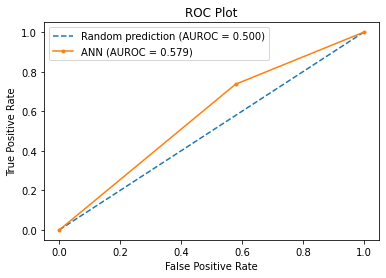

In [ ]:
plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(ann_fpr, ann_tpr, marker='.', label='ANN (AUROC = %0.3f)' % ann_auc)


# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()

# **SVC**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, train_size=0.8,stratify=y, random_state=45)


In [ ]:
from sklearn.svm import SVC
model = SVC()

In [ ]:
model.fit(X_train, y_train)


SVC()

In [ ]:
model.score(X_test, y_test)

0.6842105263157895

In [ ]:
#regularisation
#tuning Parameters
model_C = SVC(C=1)
model_C.fit(X_train, y_train)
model_C.score(X_test, y_test)

0.6842105263157895

In [ ]:
model_C = SVC(C=2)
model_C.fit(X_train, y_train)
model_C.score(X_test, y_test)

0.7631578947368421

In [ ]:
#tuning gamma
model_g = SVC(gamma=10)
model_g.fit(X_train, y_train)
model_g.score(X_test, y_test)

0.5

In [ ]:
#kernal
model_linear_kernal = SVC(kernel='linear')
model_linear_kernal.fit(X_train, y_train)

SVC(kernel='linear')

In [ ]:
model_linear_kernal.score(X_test, y_test)

0.9736842105263158

## **Perfomance Metrics**

Random (chance) Prediction: AUROC = 0.500
Supoort vector Classification: AUROC = 0.684


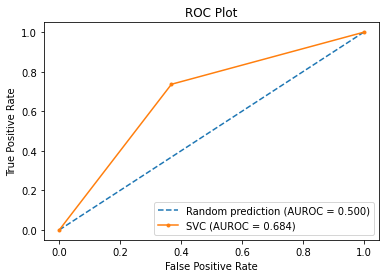

In [ ]:
y_pred=model.predict(X_test)
svcc_probs = y_pred
r_probs = [0 for _ in range(len(y_test))]
r_auc = roc_auc_score(y_test, r_probs)
svcc_auc = roc_auc_score(y_test, svcc_probs)
r_fpr, r_tpr, _ = roc_curve(y_test, r_probs)
svcc_fpr, svcc_tpr, _ = roc_curve(y_test, svcc_probs)
print('Random (chance) Prediction: AUROC = %.3f' % (r_auc))
print('Supoort vector Classification: AUROC = %.3f' % (svcc_auc))
plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(svcc_fpr, svcc_tpr, marker='.', label='SVC (AUROC = %0.3f)' % svcc_auc)


# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()

In [ ]:
conf_matrix=confusion_matrix(y_test,y_pred)

In [ ]:
    TP = conf_matrix[1][1]
    TN = conf_matrix[0][0]
    FP = conf_matrix[0][1]
    FN = conf_matrix[1][0]
    print('True Positives:', TP)
    print('True Negatives:', TN)
    print('False Positives:', FP)
    print('False Negatives:', FN)
    
    # calculate accuracy
    conf_accuracy = (float (TP+TN) / float(TP + TN + FP + FN))
    
    # calculate mis-classification
    conf_misclassification = 1- conf_accuracy
    
    # calculate the sensitivity
    conf_sensitivity = (TP / float(TP + FN))
    # calculate the specificity
    conf_specificity = (TN / float(TN + FP))
    
    # calculate precision
    conf_precision = (TP / float(TP + FP))
    # calculate f_1 score
    conf_f1 = 2 * ((conf_precision * conf_sensitivity) / (conf_precision + conf_sensitivity))
    print('-'*50)
    print(f'Accuracy: {round(conf_accuracy,2)}') 
    print(f'Mis-Classification: {round(conf_misclassification,2)}') 
    print(f'Sensitivity: {round(conf_sensitivity,2)}') 
    print(f'Specificity: {round(conf_specificity,2)}') 
    print(f'Precision: {round(conf_precision,2)}')
    print(f'f_1 Score: {round(conf_f1,2)}')

True Positives: 14
True Negatives: 12
False Positives: 7
False Negatives: 5
--------------------------------------------------
Accuracy: 0.68
Mis-Classification: 0.32
Sensitivity: 0.74
Specificity: 0.63
Precision: 0.67
f_1 Score: 0.7


# **Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, train_size=0.8, random_state=45)

In [ ]:
print('train:', len(X_train), 'test:', len(X_test))

train: 152 test: 38


In [ ]:
model = LogisticRegression()
model = model.fit(X_train, y_train)

In [ ]:
# check the accuracy on the training set
model.score(X_train, y_train)

0.9671052631578947

In [ ]:
from sklearn import datasets, metrics

In [ ]:
print ("Accuracy ON TEST SET :", metrics.accuracy_score(y_test, model.predict(X_test)))

Accuracy ON TEST SET : 0.8947368421052632


In [ ]:
conf_matrix =metrics.confusion_matrix(y_test, model.predict(X_test))

In [ ]:
    TP = conf_matrix[1][1]
    TN = conf_matrix[0][0]
    FP = conf_matrix[0][1]
    FN = conf_matrix[1][0]
    print('True Positives:', TP)
    print('True Negatives:', TN)
    print('False Positives:', FP)
    print('False Negatives:', FN)
    
    # calculate accuracy
    conf_accuracy = (float (TP+TN) / float(TP + TN + FP + FN))
    
    # calculate mis-classification
    conf_misclassification = 1- conf_accuracy
    
    # calculate the sensitivity
    conf_sensitivity = (TP / float(TP + FN))
    # calculate the specificity
    conf_specificity = (TN / float(TN + FP))
    
    # calculate precision
    conf_precision = (TP / float(TP + FP))
    # calculate f_1 score
    conf_f1 = 2 * ((conf_precision * conf_sensitivity) / (conf_precision + conf_sensitivity))
    print('-'*50)
    print(f'Accuracy: {round(conf_accuracy,2)}') 
    print(f'Mis-Classification: {round(conf_misclassification,2)}') 
    print(f'Sensitivity: {round(conf_sensitivity,2)}') 
    print(f'Specificity: {round(conf_specificity,2)}') 
    print(f'Precision: {round(conf_precision,2)}')
    print(f'f_1 Score: {round(conf_f1,2)}')

True Positives: 17
True Negatives: 17
False Positives: 4
False Negatives: 0
--------------------------------------------------
Accuracy: 0.89
Mis-Classification: 0.11
Sensitivity: 1.0
Specificity: 0.81
Precision: 0.81
f_1 Score: 0.89


In [ ]:
y_pred=model.predict(X_test)

## **ROC Curve**

In [ ]:
lgr_probs = y_pred

In [ ]:
r_probs = [0 for _ in range(len(y_test))]
r_auc = roc_auc_score(y_test, r_probs)
lgr_auc = roc_auc_score(y_test, lgr_probs)

In [ ]:
print('Random (chance) Prediction: AUROC = %.3f' % (r_auc))
print('Logistic Classification: AUROC = %.3f' % (lgr_auc))


Random (chance) Prediction: AUROC = 0.500
Logistic Classification: AUROC = 0.905


In [ ]:
r_fpr, r_tpr, _ = roc_curve(y_test, r_probs)
lgr_fpr, lgr_tpr, _ = roc_curve(y_test, lgr_probs)

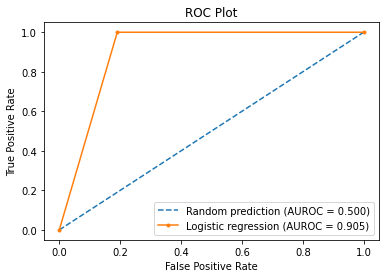

In [ ]:
plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(lgr_fpr, lgr_tpr, marker='.', label='Logistic regression (AUROC = %0.3f)' % lgr_auc)


# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()

# **KNN**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, train_size=0.8, random_state=45)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier(n_neighbors=25)

In [ ]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=25)

In [ ]:
pred = knn.predict(X_test)

In [ ]:
conf_matrix=confusion_matrix(y_test,pred)

In [ ]:
    TP = conf_matrix[1][1]
    TN = conf_matrix[0][0]
    FP = conf_matrix[0][1]
    FN = conf_matrix[1][0]
    print('True Positives:', TP)
    print('True Negatives:', TN)
    print('False Positives:', FP)
    print('False Negatives:', FN)
    
    # calculate accuracy
    conf_accuracy = (float (TP+TN) / float(TP + TN + FP + FN))
    
    # calculate mis-classification
    conf_misclassification = 1- conf_accuracy
    
    # calculate the sensitivity
    conf_sensitivity = (TP / float(TP + FN))
    # calculate the specificity
    conf_specificity = (TN / float(TN + FP))
    
    # calculate precision
    conf_precision = (TP / float(TP + FP))
    # calculate f_1 score
    conf_f1 = 2 * ((conf_precision * conf_sensitivity) / (conf_precision + conf_sensitivity))
    print('-'*50)
    print(f'Accuracy: {round(conf_accuracy,2)}') 
    print(f'Mis-Classification: {round(conf_misclassification,2)}') 
    print(f'Sensitivity: {round(conf_sensitivity,2)}') 
    print(f'Specificity: {round(conf_specificity,2)}') 
    print(f'Precision: {round(conf_precision,2)}')
    print(f'f_1 Score: {round(conf_f1,2)}')

True Positives: 9
True Negatives: 13
False Positives: 8
False Negatives: 8
--------------------------------------------------
Accuracy: 0.58
Mis-Classification: 0.42
Sensitivity: 0.53
Specificity: 0.62
Precision: 0.53
f_1 Score: 0.53


In [ ]:
###Choosing K value

In [ ]:
from sklearn.model_selection import cross_val_score
accuracy_rate = []


for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    score=cross_val_score(knn,X_sm,y_sm,cv=10)
    accuracy_rate.append(score.mean())

In [ ]:
error_rate = []


for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

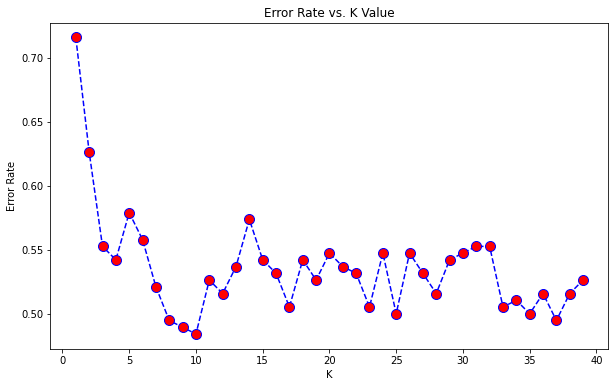

In [ ]:
plt.figure(figsize=(10,6))
#plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
  #       markerfacecolor='red', markersize=10)
plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

## **ROC curve**

Random (chance) Prediction: AUROC = 0.500
knn: AUROC = 0.508


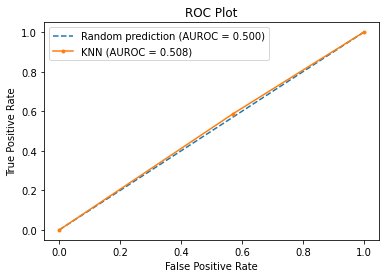

In [ ]:
y_pred=knn.predict(X_test)
knn_probs = y_pred
r_probs = [0 for _ in range(len(y_test))]
r_auc = roc_auc_score(y_test, r_probs)
knn_auc = roc_auc_score(y_test, knn_probs)
r_fpr, r_tpr, _ = roc_curve(y_test, r_probs)
knn_fpr, knn_tpr, _ = roc_curve(y_test, knn_probs)
print('Random (chance) Prediction: AUROC = %.3f' % (r_auc))
print('knn: AUROC = %.3f' % (knn_auc))
plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(knn_fpr, knn_tpr, marker='.', label='KNN (AUROC = %0.3f)' % knn_auc)


# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()

# **Decision Tree**

In [ ]:
import io
import math
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn import datasets, metrics
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix
import matplotlib.pyplot as plt

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, train_size=0.8, random_state=45)

print(X_train.shape), print(y_train.shape)
print(X_test.shape), print(y_test.shape)

(152, 36)
(152,)
(38, 36)
(38,)


(None, None)

In [ ]:
decision_tree = DecisionTreeClassifier(criterion="gini")
decision_tree = decision_tree.fit(X_train, y_train)

In [ ]:
y_test_pred = decision_tree.predict(X_test)
y_train_pred = decision_tree.predict(X_train)

print("Test split accuracy percentage: ", 100 * metrics.accuracy_score(y_test, y_test_pred))

Test split accuracy percentage:  94.73684210526315


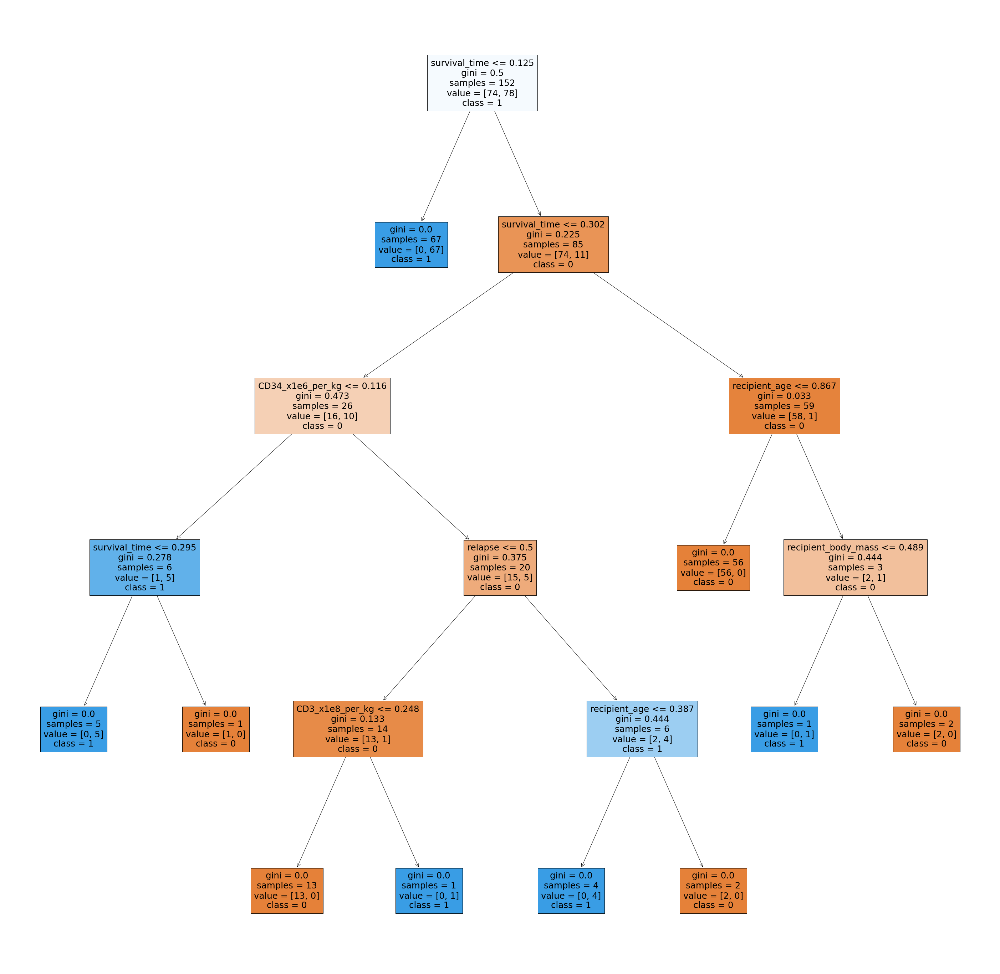

In [ ]:
# 0 means alive 1 means dead
plt.figure(figsize=(50,50))
features = df.columns
classes = ['0','1']
tree.plot_tree(decision_tree,feature_names=features,class_names=classes,filled=True)
plt.show()

In [ ]:
# helper function
def plot_confusionmatrix(y_train_pred,y_train,dom):
    print(f'{dom} Confusion matrix')
    cf = confusion_matrix(y_train_pred,y_train)
    sns.heatmap(cf,annot=True,yticklabels=classes
               ,xticklabels=classes,cmap='Blues', fmt='g')
    plt.tight_layout()
    plt.show()
    

Train score 1.0
Test score 0.9473684210526315
Train Confusion matrix


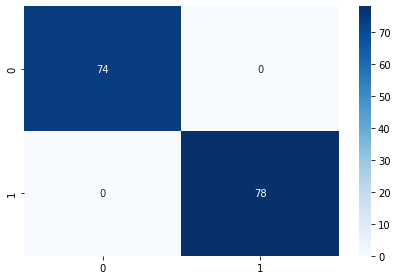

Test Confusion matrix


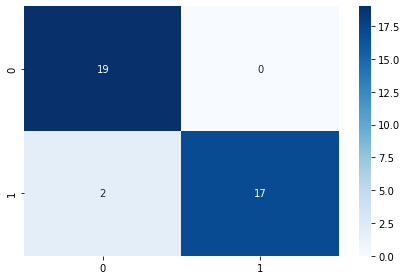

In [ ]:
print(f'Train score {accuracy_score(y_train_pred,y_train)}')
print(f'Test score {accuracy_score(y_test_pred,y_test)}')
plot_confusionmatrix(y_train_pred,y_train,dom='Train')
plot_confusionmatrix(y_test_pred,y_test,dom='Test')

## **Post Pruning**

In [ ]:
clf = DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

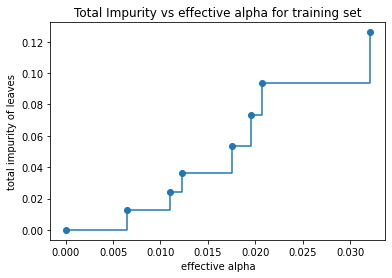

In [ ]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.373647547661724


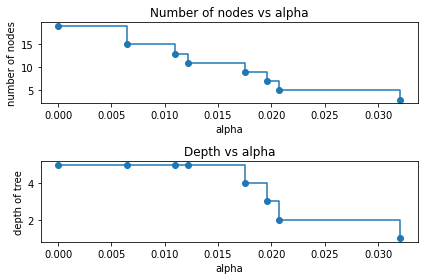

In [ ]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

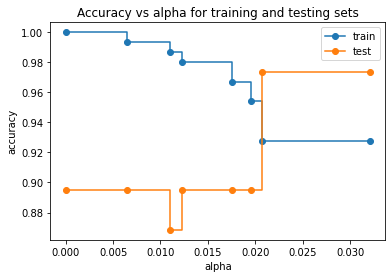

In [ ]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
clf_ = tree.DecisionTreeClassifier(random_state=0,ccp_alpha=0.015)
clf_.fit(X_train,y_train)
y_train_pred = clf_.predict(X_train)
y_test_pred = clf_.predict(X_test)

print(f'Train score {accuracy_score(y_train_pred,y_train)}')
print(f'Test score {accuracy_score(y_test_pred,y_test)}')

Train score 0.9802631578947368
Test score 0.8947368421052632


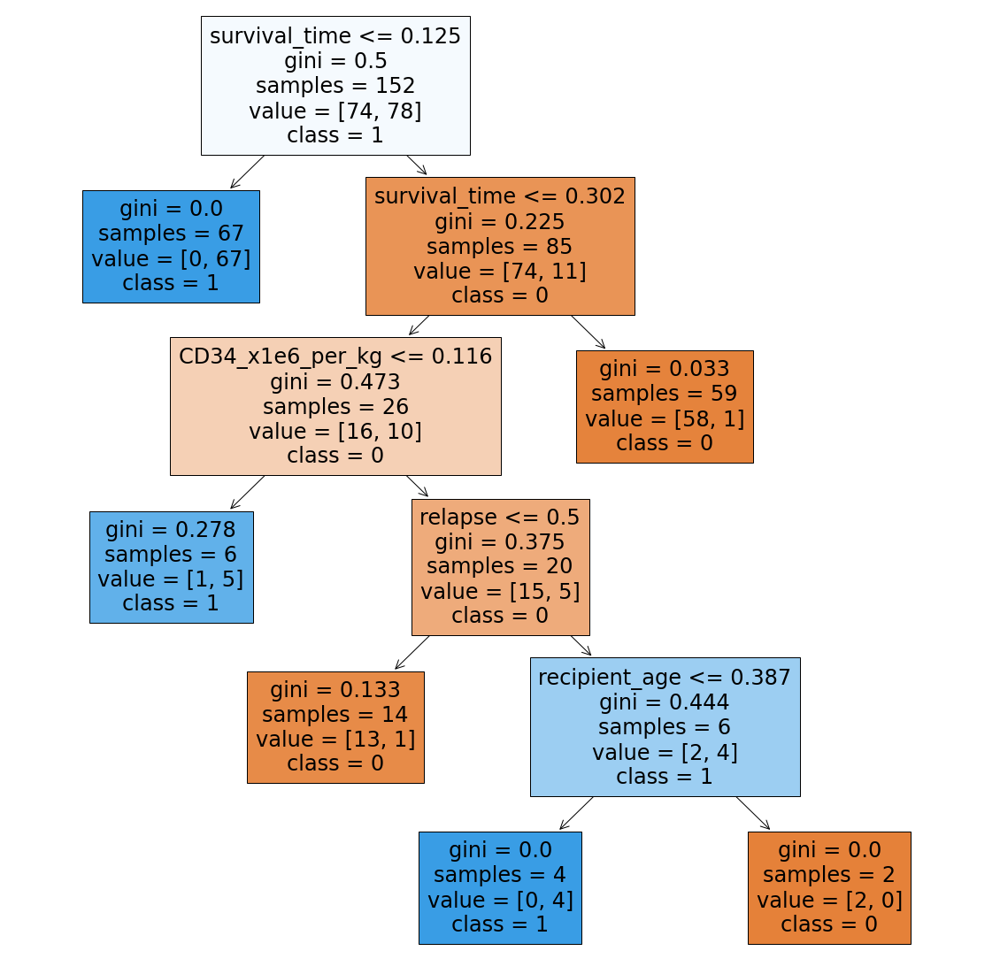

In [ ]:
plt.figure(figsize=(20,20))
features = df.columns
classes = ['0','1']
tree.plot_tree(clf_,feature_names=features,class_names=classes,filled=True)
plt.show()

## **Perfomance metrics**

Train score 0.9802631578947368
Test score 0.8947368421052632
Train Confusion matrix


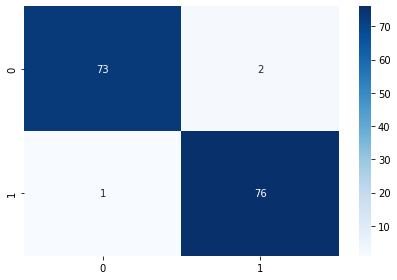

Test Confusion matrix


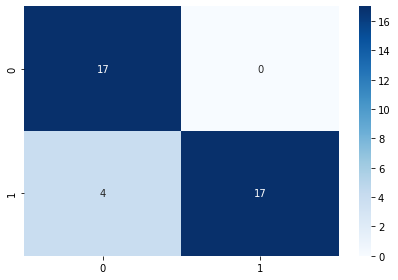

In [ ]:
print(f'Train score {accuracy_score(y_train_pred,y_train)}')
print(f'Test score {accuracy_score(y_test_pred,y_test)}')
plot_confusionmatrix(y_train_pred,y_train,dom='Train')
plot_confusionmatrix(y_test_pred,y_test,dom='Test')

In [ ]:
from sklearn import metrics
precision_positive = metrics.precision_score(y_test, y_test_pred, pos_label=1)
print(f'precision_positive {precision_positive}')

precision_positive 0.8095238095238095


In [ ]:
recall= metrics.recall_score(y_test, y_test_pred, pos_label=1)
print(f'recall {recall}')

recall 1.0


In [ ]:
f1 = metrics.f1_score(y_test, y_test_pred, pos_label=1)
print(f'F1 score {f1}')

F1 score 0.8947368421052632


In [ ]:
#ROC curve and AUROC
dt_probs = y_test_pred
l= y_test_pred.tolist()
pred_test_list= [int(i) for i in l]
y_test_pred = pred_test_list
dt_probs = y_test_pred

In [ ]:
print(y_test_pred)

[0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1]


In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score

In [ ]:
r_probs = [0 for _ in range(len(y_test_pred))]
r_auc = roc_auc_score(y_test_pred, r_probs)
dt_auc = roc_auc_score(y_test_pred, dt_probs)

In [ ]:
print('Random (chance) Prediction: AUROC = %.3f' % (r_auc))
print('DT: AUROC = %.3f' % (dt_auc))

Random (chance) Prediction: AUROC = 0.500
DT: AUROC = 1.000


In [ ]:
r_fpr, r_tpr, _ = roc_curve(y_test, r_probs)
dt_fpr, dt_tpr, _ = roc_curve(y_test, dt_probs)

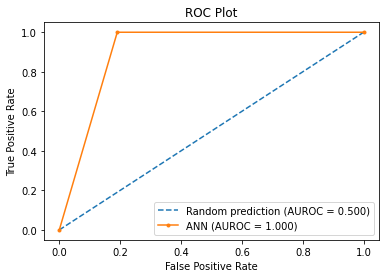

In [ ]:
plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(dt_fpr, dt_tpr, marker='.', label='ANN (AUROC = %0.3f)' % dt_auc)


# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()

#**Ensembling_Bagging** 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, train_size=0.8,stratify=y, random_state=45)


In [ ]:
y_train.value_counts()


1    76
0    76
Name: survival_status, dtype: int64

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier

scores = cross_val_score(DecisionTreeClassifier(), X_sm, y_sm, cv=5)
scores
scores.mean()


0.8947368421052632

In [ ]:
from sklearn.ensemble import BaggingClassifier

bag_model = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(), 
    n_estimators=100, 
    max_samples=0.8, 
    oob_score=True,
    random_state=0
)
bag_model.fit(X_train, y_train)
bag_model.oob_score_

0.9210526315789473

In [ ]:
bag_model.score(X_test, y_test)
##accuracy of bag model after bagging

0.9473684210526315

In [ ]:
bag_model = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(), 
    n_estimators=100, 
    max_samples=0.8, 
    oob_score=True,
    random_state=0
)
scores = cross_val_score(bag_model, X_sm, y_sm, cv=5)
scores
scores.mean()
#accuracy of bag moddel before bagging...

0.9315789473684211

# **Random Forest**

In [ ]:
# importing random forest classifier from assemble module
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# creating a RF classifier
rf = RandomForestClassifier(n_estimators = 100) 
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
rf.fit(X_train, y_train)
 
# performing predictions on the test dataset
y_pred = rf.predict(X_test)
 
# metrics are used to find accuracy or error
from sklearn import metrics 
print()
 
# using metrics module for accuracy calculation
print("ACCURACY OF THE MODEL: ", metrics.accuracy_score(y_test, y_pred))


ACCURACY OF THE MODEL:  0.9736842105263158


In [ ]:
y_test_pred = rf.predict(X_test)
y_train_pred = rf.predict(X_train)

## **Perfomance Metrics**

In [ ]:
# helper function
classes = ['0','1']
def plot_confusionmatrix(y_train_pred,y_train,dom):
    print(f'{dom} Confusion matrix')
    cf = confusion_matrix(y_train_pred,y_train)
    sns.heatmap(cf,annot=True,yticklabels=classes
               ,xticklabels=classes,cmap='Blues', fmt='g')
    plt.tight_layout()
    plt.show()

Train score 1.0
Test score 0.9736842105263158
Train Confusion matrix


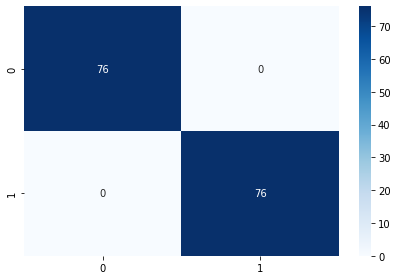

Test Confusion matrix


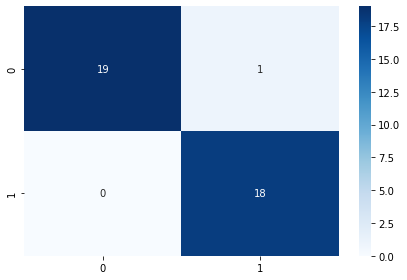

In [ ]:
print(f'Train score {accuracy_score(y_train_pred,y_train)}')
print(f'Test score {accuracy_score(y_test_pred,y_test)}')
plot_confusionmatrix(y_train_pred,y_train,dom='Train')
plot_confusionmatrix(y_test_pred,y_test,dom='Test')

In [ ]:
from sklearn import metrics
precision_positive = metrics.precision_score(y_test, y_test_pred, pos_label=1)
print(f'precision_positive {precision_positive}')
recall= metrics.recall_score(y_test, y_test_pred, pos_label=1)
print(f'recall {recall}')
f1 = metrics.f1_score(y_test, y_test_pred, pos_label=1)
print(f'F1 score {f1}')

precision_positive 1.0
recall 0.9473684210526315
F1 score 0.972972972972973


In [ ]:
f1 = metrics.f1_score(y_test, y_test_pred, pos_label=1)
print(f'F1 score {f1}')

F1 score 0.972972972972973


Random (chance) Prediction: AUROC = 0.500
RandomForest: AUROC = 0.974


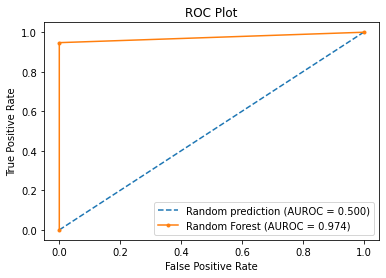

In [ ]:
y_pred=rf.predict(X_test)
rf_probs = y_pred
r_probs = [0 for _ in range(len(y_test))]
r_auc = roc_auc_score(y_test, r_probs)
rf_auc = roc_auc_score(y_test, rf_probs)
r_fpr, r_tpr, _ = roc_curve(y_test, r_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
print('Random (chance) Prediction: AUROC = %.3f' % (r_auc))
print('RandomForest: AUROC = %.3f' % (rf_auc))
plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(rf_fpr, rf_tpr, marker='.', label='Random Forest (AUROC = %0.3f)' % rf_auc)


# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()

# **Ensembling_ADA boost**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, train_size=0.8, random_state=45)

In [ ]:
AdaModel = AdaBoostClassifier(n_estimators=100,
                         learning_rate=1)

In [ ]:
model = AdaModel.fit(X_train, y_train)

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8947368421052632


In [ ]:
# Import Support Vector Classifier
from sklearn.svm import SVC
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
svc=SVC(probability=True, kernel='linear')

# Create adaboost classifer object
abc =AdaBoostClassifier(n_estimators=50, base_estimator=svc,learning_rate=1)

In [ ]:
model = abc.fit(X_train, y_train)


In [ ]:
# Train Adaboost Classifer
model = abc.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = model.predict(X_test)

In [ ]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8947368421052632


In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)

In [ ]:
conf_matrix

array([[17,  4],
       [ 0, 17]])

In [ ]:
    TP = conf_matrix[1][1]
    TN = conf_matrix[0][0]
    FP = conf_matrix[0][1]
    FN = conf_matrix[1][0]
    print('True Positives:', TP)
    print('True Negatives:', TN)
    print('False Positives:', FP)
    print('False Negatives:', FN)
    
    # calculate accuracy
    conf_accuracy = (float (TP+TN) / float(TP + TN + FP + FN))
    
    # calculate mis-classification
    conf_misclassification = 1- conf_accuracy
    
    # calculate the sensitivity
    conf_sensitivity = (TP / float(TP + FN))
    # calculate the specificity
    conf_specificity = (TN / float(TN + FP))
    
    # calculate precision
    conf_precision = (TP / float(TP + FP))
    # calculate f_1 score
    conf_f1 = 2 * ((conf_precision * conf_sensitivity) / (conf_precision + conf_sensitivity))
    print('-'*50)
    print(f'Accuracy: {round(conf_accuracy,2)}') 
    print(f'Mis-Classification: {round(conf_misclassification,2)}') 
    print(f'Sensitivity: {round(conf_sensitivity,2)}') 
    print(f'Specificity: {round(conf_specificity,2)}') 
    print(f'Precision: {round(conf_precision,2)}')
    print(f'f_1 Score: {round(conf_f1,2)}')

True Positives: 17
True Negatives: 17
False Positives: 4
False Negatives: 0
--------------------------------------------------
Accuracy: 0.89
Mis-Classification: 0.11
Sensitivity: 1.0
Specificity: 0.81
Precision: 0.81
f_1 Score: 0.89


## **ROC_AUC for Adaboost**

In [ ]:
ada_probs = y_pred

In [ ]:
r_probs = [0 for _ in range(len(y_test))]
r_auc = roc_auc_score(y_test, r_probs)
ada_auc = roc_auc_score(y_test, ada_probs)

In [ ]:
print('Random (chance) Prediction: AUROC = %.3f' % (r_auc))
print('AdaBoost: AUROC = %.3f' % (ada_auc))


Random (chance) Prediction: AUROC = 0.500
AdaBoost: AUROC = 0.905


In [ ]:
r_fpr, r_tpr, _ = roc_curve(y_test, r_probs)
ada_fpr, ada_tpr, _ = roc_curve(y_test, ada_probs)


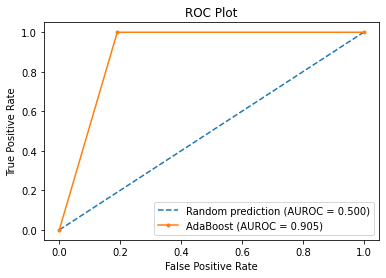

In [ ]:
plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(ada_fpr, ada_tpr, marker='.', label='AdaBoost (AUROC = %0.3f)' % ada_auc)


# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()